In [1]:
!pip install kaggle

In [2]:
!pip install kaggle
!pip install git+https://github.com/lucasb-eyer/pydensecrf.git

!pip install pydensecrf

  Cloning https://github.com/lucasb-eyer/pydensecrf.git to /tmp/pip-req-build-hm1bkzt6
  Running command git clone --filter=blob:none --quiet https://github.com/lucasb-eyer/pydensecrf.git /tmp/pip-req-build-hm1bkzt6
  Resolved https://github.com/lucasb-eyer/pydensecrf.git to commit dd070546eda51e21ab772ee6f14807c7f5b1548b
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Preparing metadata (pyproject.toml) ... done
  Created wheel for pydensecrf: filename=pydensecrf-1.0-cp310-cp310-linux_x86_64.whl size=3405484 sha256=5d76a3371411d018e7c6c54676bbdc02117ea05800168271aadbecf9bf411c54
  Stored in directory: /tmp/pip-ephem-wheel-cache-hutmxj2u/wheels/01/5b/61/87443ed3bf03dd2940375cf2f8b6fba88efece935465e490b0
Successfully built pydensecrf


In [3]:
from google.colab import files
files.upload()

Saving kaggle (2).json to kaggle (2).json


{'kaggle (2).json': b'{"username":"mahajanbhushan","key":"88002547ce5a2790b7eda0352585b43c"}'}

In [4]:
!mkdir -p ~/.kaggle
!cp "kaggle (2).json" ~/.kaggle/kaggle.json
!chmod 600 ~/.kaggle/kaggle.json

In [5]:
!kaggle datasets download -d balraj98/deepglobe-road-extraction-dataset
!unzip -q deepglobe-road-extraction-dataset.zip -d dataset-folder

100% 3.79G/3.79G [00:31<00:00, 218MB/s]
100% 3.79G/3.79G [00:31<00:00, 128MB/s]


In [6]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


##Reading Training Data

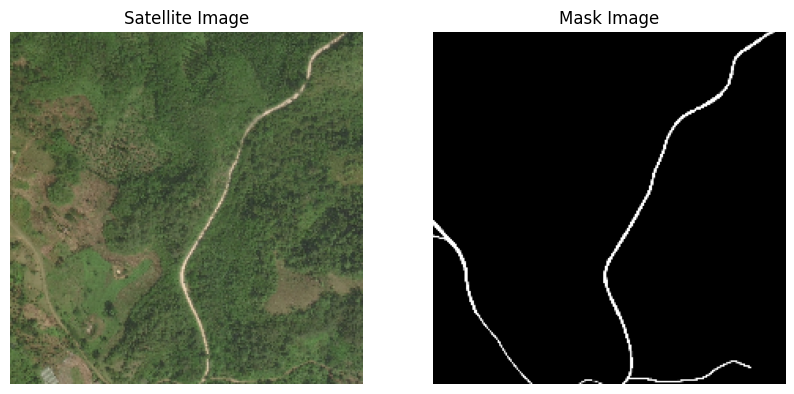

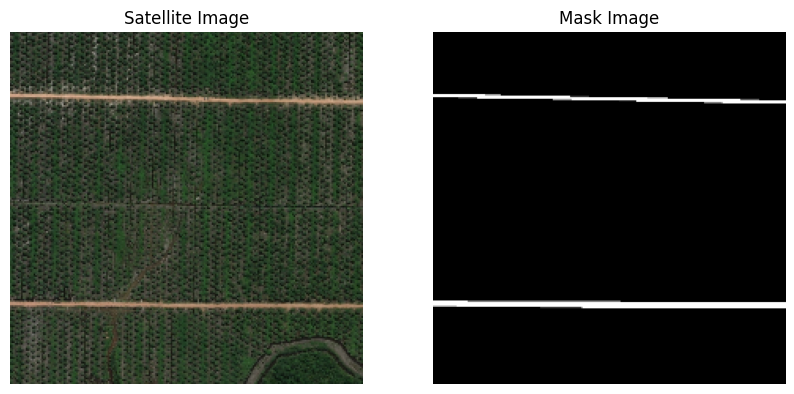

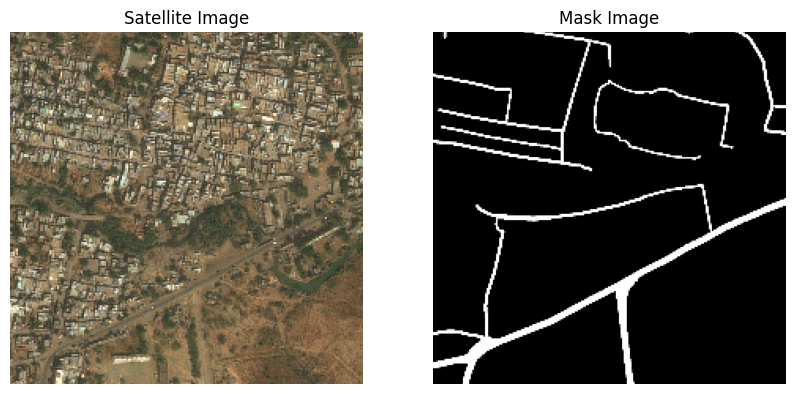

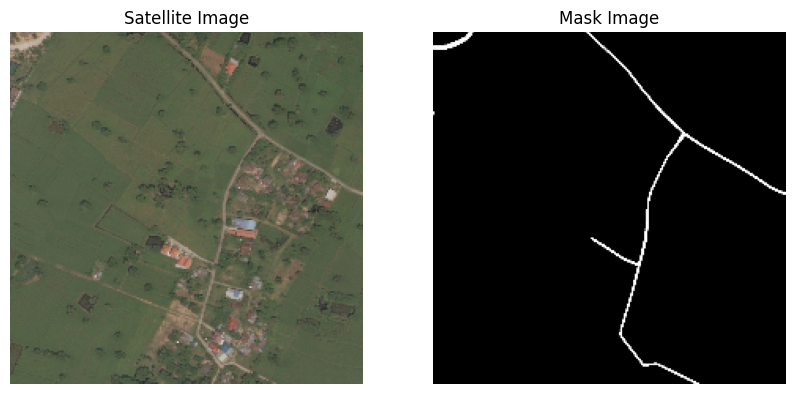

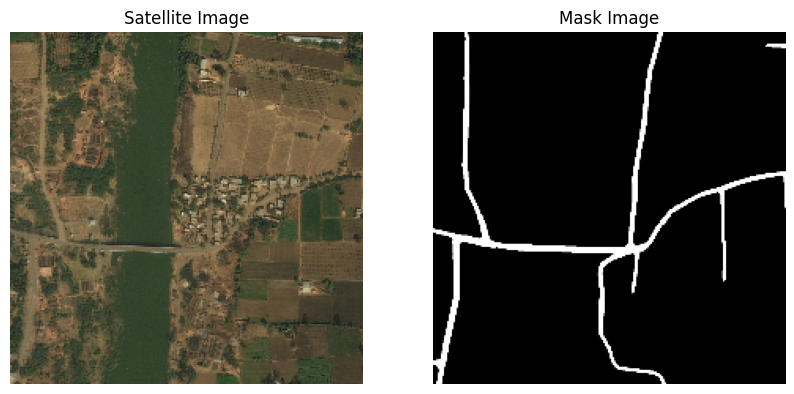

In [ ]:
import os
import cv2
import numpy as np
import matplotlib.pyplot as plt
dataset_folder = '/content/dataset-folder/train'
images = []
masks = []
file_list = os.listdir(dataset_folder)
file_list.sort()
for i in range(0, len(file_list), 2):
    satellite_image_filename = file_list[i + 1]
    mask_image_filename = file_list[i]
    satellite_image_path = os.path.join(dataset_folder, satellite_image_filename)
    mask_image_path = os.path.join(dataset_folder, mask_image_filename)
    satellite_image = cv2.imread(satellite_image_path)
    satellite_image = cv2.cvtColor(satellite_image, cv2.COLOR_BGR2RGB)  # Convert to RGB
    satellite_image = cv2.resize(satellite_image, (224, 224))  # Resize as (224,224)
    satellite_image = satellite_image / 255.0  # Normalize pixel values to [0, 1]
    mask_image = cv2.imread(mask_image_path, cv2.IMREAD_GRAYSCALE)
    mask_image = cv2.resize(mask_image, (224, 224))  # Resize to (224,224)
    mask_image = np.expand_dims(mask_image, axis=-1)  # Adding a channel dimension
    mask_image = mask_image / 255.0
    images.append(satellite_image)
    masks.append(mask_image)
images_aug = np.array(images)
masks_aug = np.array(masks)#Converting to array
num_images_to_display = 5  # Number of images to display

for i in range(num_images_to_display):
    plt.figure(figsize=(10, 5))

    # Display image
    plt.subplot(1, 2, 1)
    plt.imshow(images_aug[i])
    plt.title('Satellite Image')
    plt.axis('off')

    # Display corresponding mask
    plt.subplot(1, 2, 2)
    plt.imshow(masks_aug[i].squeeze(), cmap='gray')  # Squeeze to remove the single-channel dimension
    plt.title('Mask Image')
    plt.axis('off')
    plt.show()

##Splitting

In [ ]:
from sklearn.model_selection import train_test_split
X_train, X_valid, y_train, y_valid = train_test_split(
    images_aug,
    masks_aug,
    test_size=0.1,
    random_state=42
)

##Augmentation using ImageDataGenerator

In [ ]:
from keras.preprocessing.image import ImageDataGenerator
train_image_data_gen_aug = ImageDataGenerator(
    rotation_range=10, # Images will be rotated by a random angle within 10 degrees.
    width_shift_range=0.1, # Images will be shifted horizontally by up to 10% of the total width.
    height_shift_range=0.1, # Images will be shifted vertically by up to 10% of the total height.
    shear_range=0.1, # Images will be sheared by a random angle within 10 degrees.
    zoom_range=0.1, # Images will be randomly zoomed in or out by up to 10%.
    horizontal_flip=True, # Images will be randomly flipped horizontally.
    fill_mode='nearest' # Strategy used to fill newly created pixels, which can appear after a rotation or a width/height shift.
)

train_mask_data_gen_aug = ImageDataGenerator(
    rotation_range=10,
    width_shift_range=0.1,
    height_shift_range=0.1,
    shear_range=0.1,
    zoom_range=0.1,
    horizontal_flip=True,
    fill_mode='nearest',
    preprocessing_function=lambda x: np.where(x > 0.5, 1, 0).astype(x.dtype)
)

In [ ]:
seed = 42
train_image_generator = train_image_data_gen_aug.flow(X_train, seed=seed, batch_size=32)
train_mask_generator = train_mask_data_gen_aug.flow(y_train, seed=seed, batch_size=32)
train_generator = zip(train_image_generator, train_mask_generator)

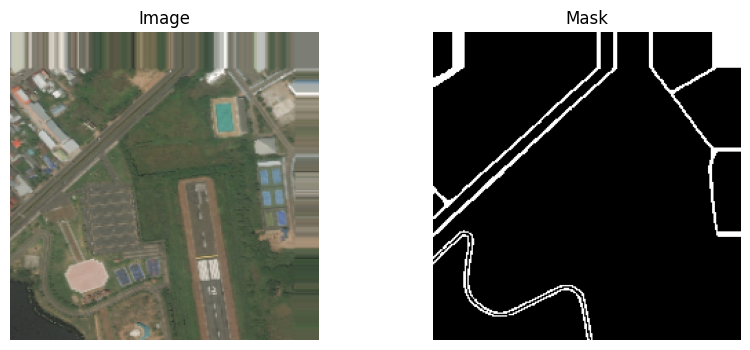

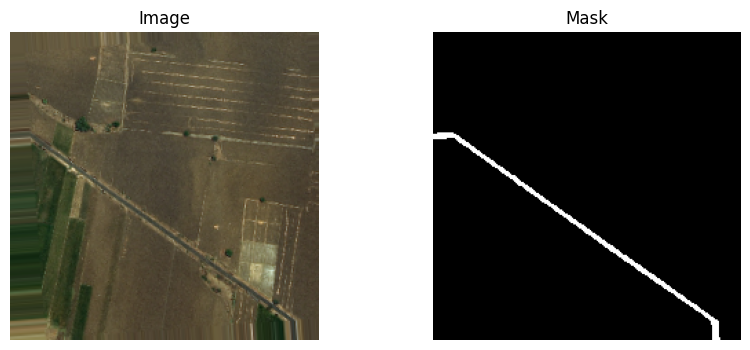

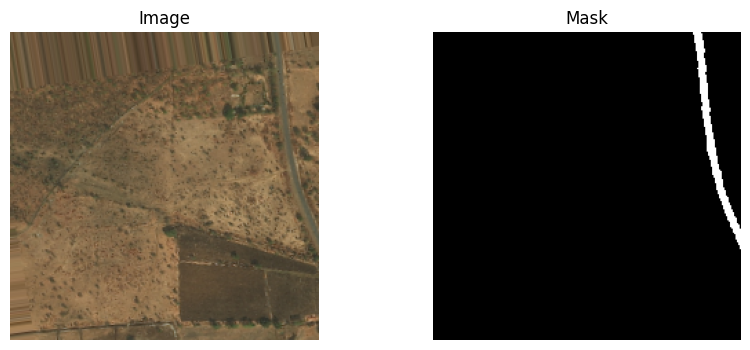

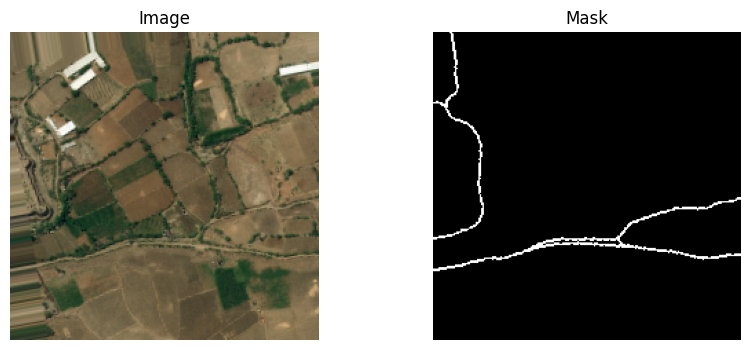

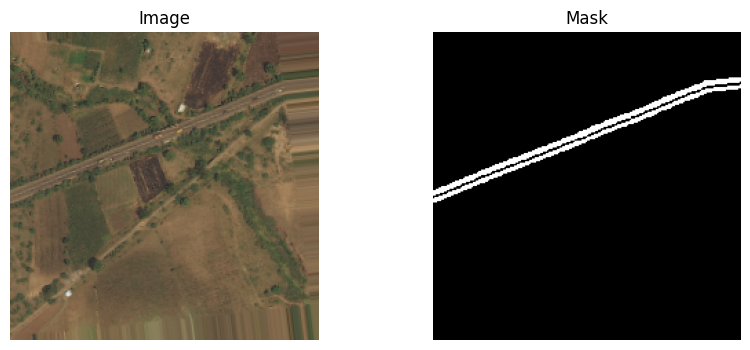

In [ ]:
import matplotlib.pyplot as plt
num_images_to_display = 5
images, masks = next(train_generator)
for i in range(num_images_to_display):
    plt.figure(figsize=(10, 4))

    # Display image
    plt.subplot(1, 2, 1)
    plt.imshow(images[i])
    plt.title('Image')
    plt.axis('off')

    # Display corresponding mask
    plt.subplot(1, 2, 2)
    plt.imshow(masks[i][:, :, 0], cmap='gray')
    plt.title('Mask')
    plt.axis('off')

    plt.show()

In [ ]:
valid_image_data_gen_aug = ImageDataGenerator()
valid_mask_data_gen_aug = ImageDataGenerator()
valid_image_generator = valid_image_data_gen_aug.flow(X_valid, batch_size=32, seed=seed, shuffle=False)
valid_mask_generator = valid_mask_data_gen_aug.flow(y_valid, batch_size=32, seed=seed, shuffle=False)
valid_generator = zip(valid_image_generator, valid_mask_generator)

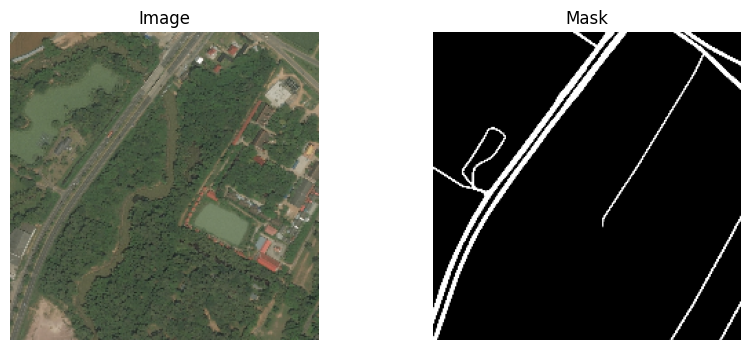

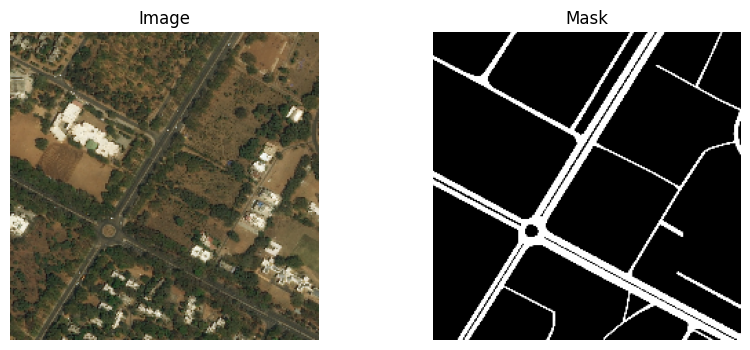

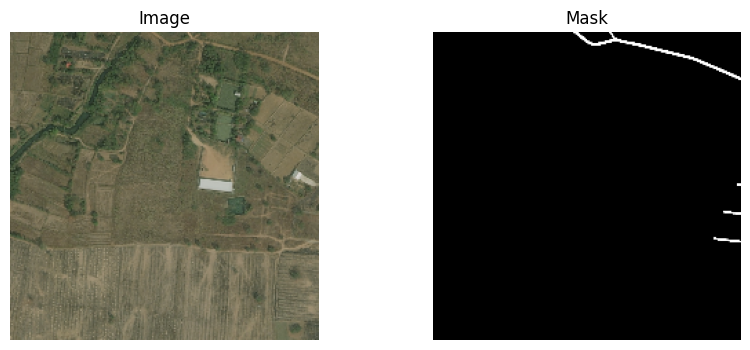

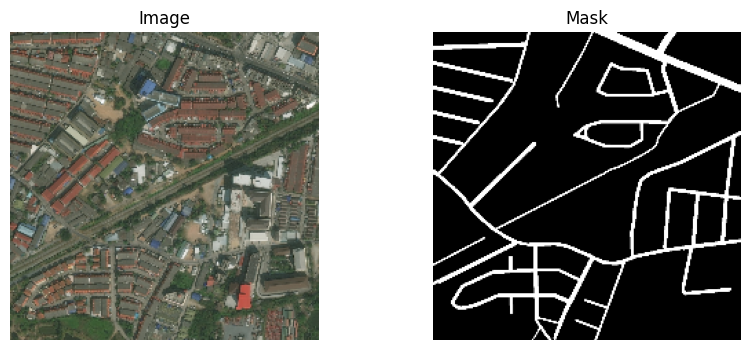

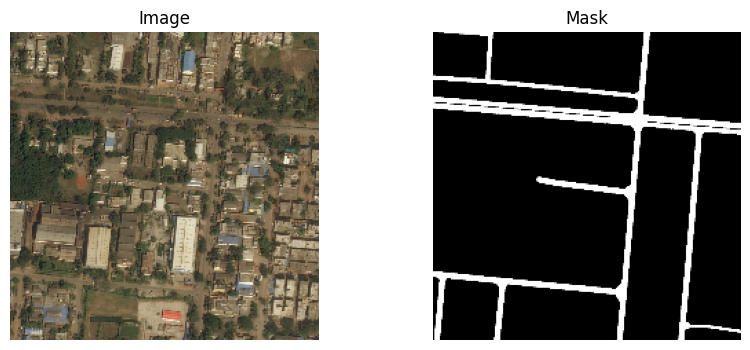

In [ ]:
num_images_to_display = 5
images, masks = next(valid_generator)
for i in range(num_images_to_display):
    plt.figure(figsize=(10, 4))

    # Display image
    plt.subplot(1, 2, 1)
    plt.imshow(images[i])
    plt.title('Image')
    plt.axis('off')

    # Display corresponding mask
    plt.subplot(1, 2, 2)
    plt.imshow(masks[i][:, :, 0], cmap='gray')
    plt.title('Mask')
    plt.axis('off')

    plt.show()

##Model Fusion

In [ ]:
import numpy as np
from keras.applications import ResNet50, VGG16
from keras.layers import Input, Concatenate, Conv2D, UpSampling2D, Conv2DTranspose
from keras.models import Model
from keras.preprocessing.image import ImageDataGenerator
from keras.optimizers import Adam
input_tensor = Input(shape=(224, 224, 3))
# Load pre-trained ResNet50 model
resnet_model = ResNet50(weights='imagenet', include_top=False, input_tensor=input_tensor)
# Load pre-trained VGG16 model
vgg_model = VGG16(weights='imagenet', include_top=False, input_tensor=input_tensor)

# Below code is to get features from both models, ensuring the output feature maps are the same size.
resnet_features = resnet_model.output
vgg_features = vgg_model.output
# Merge the feature maps from ResNet and VGG using concatenation.
merged_features = Concatenate()([resnet_features, vgg_features])
x = merged_features

# Gradual upsampling
x = Conv2DTranspose(256, (3, 3), strides=(2, 2), padding='same')(x)  # Upsample to the correct size
x = Conv2D(256, (3, 3), activation='relu', padding='same')(x)
x = Conv2DTranspose(128, (3, 3), strides=(2, 2), padding='same')(x)
x = Conv2D(128, (3, 3), activation='relu', padding='same')(x)
x = Conv2DTranspose(64, (3, 3), strides=(2, 2), padding='same')(x)
x = Conv2D(64, (3, 3), activation='relu', padding='same')(x)
x = Conv2DTranspose(64, (3, 3), strides=(2, 2), padding='same')(x)
x = Conv2D(64, (3, 3), activation='relu', padding='same')(x)
# Final upsampling to match the desired output size
output = Conv2DTranspose(64, (3, 3), strides=(2, 2), padding='same')(x)
#Applied Sigmoid function to get probabilities from 0 to 1 for masking
output = Conv2D(1, (1, 1), activation='sigmoid', padding='same')(output)
fusion_model = Model(inputs=input_tensor, outputs=output)
fusion_model.compile(
    optimizer=Adam(),
    loss='binary_crossentropy',
    metrics=['accuracy']
)
fusion_model.summary()
history = fusion_model.fit(
    train_generator,
    steps_per_epoch=len(X_train) // 32,
    validation_data=valid_generator,
    validation_steps=len(X_valid) // 32,
    epochs=20
)

58889256/58889256 [==============================] - 2s 0us/step
Model: "model"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_1 (InputLayer)        [(None, 224, 224, 3)]        0         []                            
                                                                                                  
 conv1_pad (ZeroPadding2D)   (None, 230, 230, 3)          0         ['input_1[0][0]']             
                                                                                                  
 conv1_conv (Conv2D)         (None, 112, 112, 64)         9472      ['conv1_pad[0][0]']           
                                                                                                  
 conv1_bn (BatchNormalizati  (None, 112, 112, 64)         256       ['conv1_conv[0][0]']          
 on)                         

##Analysis of the Algorithm

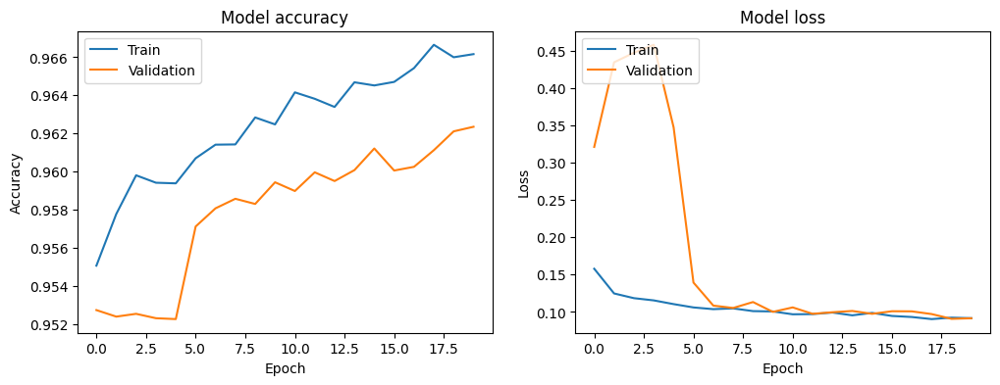

In [ ]:
import matplotlib.pyplot as plt

# Plot training & validation accuracy values
plt.figure(figsize=(12, 4))

plt.subplot(1, 2, 1)
plt.plot(history.history['accuracy'])
plt.plot(history.history['val_accuracy'])
plt.title('Model accuracy')
plt.ylabel('Accuracy')
plt.xlabel('Epoch')
plt.legend(['Train', 'Validation'], loc='upper left')

# Plot training & validation loss values
plt.subplot(1, 2, 2)
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.title('Model loss')
plt.ylabel('Loss')
plt.xlabel('Epoch')
plt.legend(['Train', 'Validation'], loc='upper left')

plt.show()

In [ ]:
import pickle
fusion_model_augmentation_file = "/content/drive/MyDrive/Cv_Project/Model_fusion/fusion_model_augmentation_model.pkl"
with open(fusion_model_augmentation_file, 'wb') as file:
    pickle.dump(fusion_model, file)

In [ ]:
import pickle
with open('/content/drive/MyDrive/Cv_Project/Model_fusion/fusion_model_augmentation_history.pkl', 'wb') as file:
    pickle.dump(history.history, file)
print("Training history saved!")

Training history saved!


##Predictions on Model Fusion

35/35 [==============================] - 14s 295ms/step


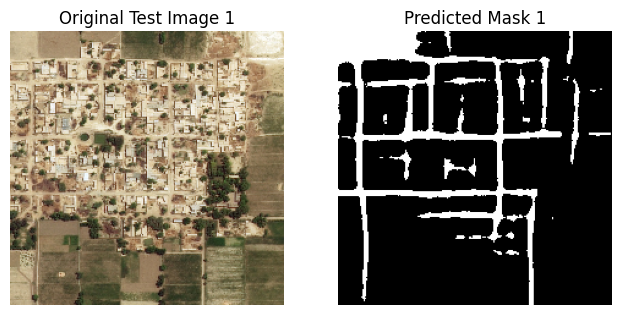

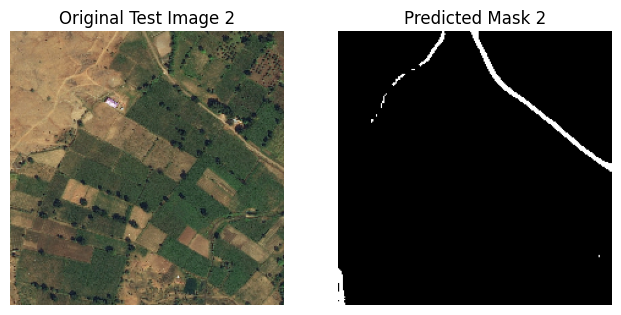

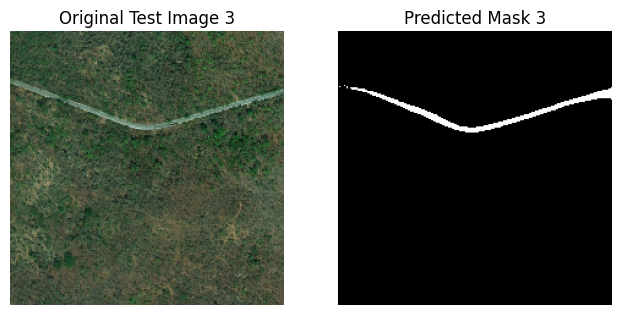

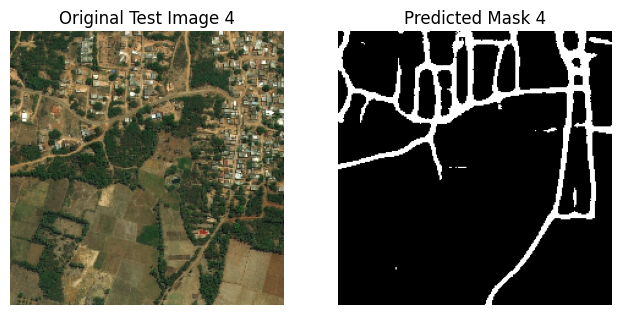

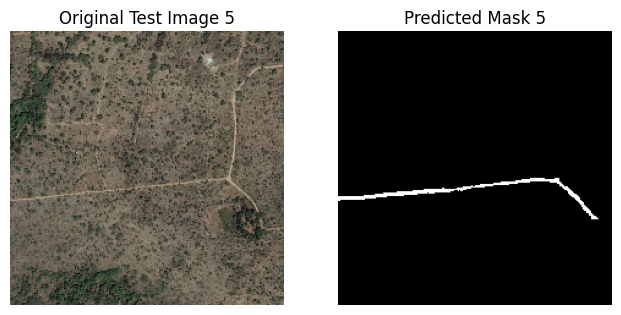

In [14]:
import os
import cv2
import numpy as np
import pickle

# Load the model from the pickle file
with open('/content/drive/MyDrive/Cv_Project/Model_fusion/fusion_model_augmentation_model.pkl', 'rb') as file:
    fusion_model = pickle.load(file)

test_folder = '/content/dataset-folder/test'

test_images = []
test_filenames = []

# Load and preprocess test images
for filename in sorted(os.listdir(test_folder)):
    if filename.endswith('.jpg'):
        img_path = os.path.join(test_folder, filename)
        img = cv2.imread(img_path, cv2.IMREAD_COLOR)
        img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)  # Convert to RGB
        img = cv2.resize(img, (224, 224))  # Resize to match the model's input
        img = img / 255.0  # Normalize the image
        test_images.append(img)
        test_filenames.append(filename)
test_images_np = np.array(test_images)
threshold = 0.1  #Set low as we want to get maximum road extracted from images.

# Generate predictions
predictions_fusion = fusion_model.predict(test_images_np)
predictions_thresholded = (predictions_fusion > threshold).astype(np.uint8)
import matplotlib.pyplot as plt
num_images_to_show = 5
for i in range(min(num_images_to_show, len(test_images))):
    plt.figure(figsize=(12, 6))

    plt.subplot(1, 3, 1)
    plt.imshow(test_images_np[i])
    plt.title(f'Original Test Image {i+1}')
    plt.axis('off')

    plt.subplot(1, 3, 2)
    plt.imshow(predictions_thresholded[i].squeeze(), cmap='gray')
    plt.title(f'Predicted Mask {i+1}')
    plt.axis('off')

    plt.show()

##Unet Model

In [ ]:
from tensorflow.keras.layers import Input, Conv2D, MaxPooling2D, Dropout, concatenate, Conv2DTranspose
from tensorflow.keras.models import Model

def unet(input_size=(224, 224, 3)):
    inputs = Input(input_size)
    conv1 = Conv2D(64, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(inputs)
    conv1 = Dropout(0.1)(conv1)
    conv1 = Conv2D(64, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(conv1)
    pool1 = MaxPooling2D((2, 2))(conv1)
    conv2 = Conv2D(128, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(pool1)
    conv2 = Dropout(0.1)(conv2)
    conv2 = Conv2D(128, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(conv2)
    pool2 = MaxPooling2D((2, 2))(conv2)
    conv3 = Conv2D(256, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(pool2)
    conv3 = Dropout(0.2)(conv3)
    conv3 = Conv2D(256, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(conv3)
    pool3 = MaxPooling2D((2, 2))(conv3)
    conv4 = Conv2D(512, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(pool3)
    conv4 = Dropout(0.2)(conv4)
    conv4 = Conv2D(512, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(conv4)
    pool4 = MaxPooling2D(pool_size=(2, 2))(conv4)
    conv5 = Conv2D(1024, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(pool4)
    conv5 = Dropout(0.3)(conv5)
    conv5 = Conv2D(1024, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(conv5)
    # Decoder
    decoder6 = Conv2DTranspose(512, (2, 2), strides=(2, 2), padding='same')(conv5)
    decoder6 = concatenate([decoder6, conv4])
    conv6 = Conv2D(512, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(decoder6)
    conv6 = Dropout(0.2)(conv6)
    conv6 = Conv2D(512, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(conv6)
    decoder7 = Conv2DTranspose(256, (2, 2), strides=(2, 2), padding='same')(conv6)
    decoder7 = concatenate([decoder7, conv3])
    conv7 = Conv2D(256, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(decoder7)
    conv7 = Dropout(0.2)(conv7)
    conv7 = Conv2D(256, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(conv7)
    decoder8 = Conv2DTranspose(128, (2, 2), strides=(2, 2), padding='same')(conv7)
    decoder8 = concatenate([decoder8, conv2])
    conv8 = Conv2D(128, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(decoder8)
    conv8 = Dropout(0.1)(conv8)
    conv8 = Conv2D(128, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(conv8)
    decoder9 = Conv2DTranspose(64, (2, 2), strides=(2, 2), padding='same')(conv8)
    decoder9 = concatenate([decoder9, conv1], axis=3)
    conv9 = Conv2D(64, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(decoder9)
    conv9 = Dropout(0.1)(conv9)
    conv9 = Conv2D(64, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(conv9)
    # Output layer
    outputs = Conv2D(1, (1, 1), activation='sigmoid')(conv9)
    model = Model(inputs=[inputs], outputs=[outputs])
    model.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])

    return model
unet_model = unet()
unet_model.summary()

Model: "model_1"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_2 (InputLayer)        [(None, 224, 224, 3)]        0         []                            
                                                                                                  
 conv2d_5 (Conv2D)           (None, 224, 224, 64)         1792      ['input_2[0][0]']             
                                                                                                  
 dropout (Dropout)           (None, 224, 224, 64)         0         ['conv2d_5[0][0]']            
                                                                                                  
 conv2d_6 (Conv2D)           (None, 224, 224, 64)         36928     ['dropout[0][0]']             
                                                                                            

In [ ]:
# Fit the model
history1 = unet_model.fit(
    train_generator,
    validation_data=valid_generator,
    steps_per_epoch=len(X_train) // 32,
    validation_steps=len(X_valid) // 32,
    epochs=20
)

Epoch 1/20
175/175 [==============================] - 93s 465ms/step - loss: 0.1957 - accuracy: 0.9498 - val_loss: 0.1580 - val_accuracy: 0.9527
Epoch 2/20
175/175 [==============================] - 78s 447ms/step - loss: 0.1515 - accuracy: 0.9576 - val_loss: 0.1468 - val_accuracy: 0.9524
Epoch 3/20
175/175 [==============================] - 78s 447ms/step - loss: 0.1445 - accuracy: 0.9577 - val_loss: 0.1363 - val_accuracy: 0.9531
Epoch 4/20
175/175 [==============================] - 78s 447ms/step - loss: 0.1341 - accuracy: 0.9587 - val_loss: 0.1198 - val_accuracy: 0.9546
Epoch 5/20
175/175 [==============================] - 78s 443ms/step - loss: 0.1273 - accuracy: 0.9590 - val_loss: 0.1115 - val_accuracy: 0.9562
Epoch 6/20
175/175 [==============================] - 77s 443ms/step - loss: 0.1226 - accuracy: 0.9602 - val_loss: 0.1044 - val_accuracy: 0.9589
Epoch 7/20
175/175 [==============================] - 78s 444ms/step - loss: 0.1140 - accuracy: 0.9620 - val_loss: 0.0972 - val_ac

##Analysis of Unet Model

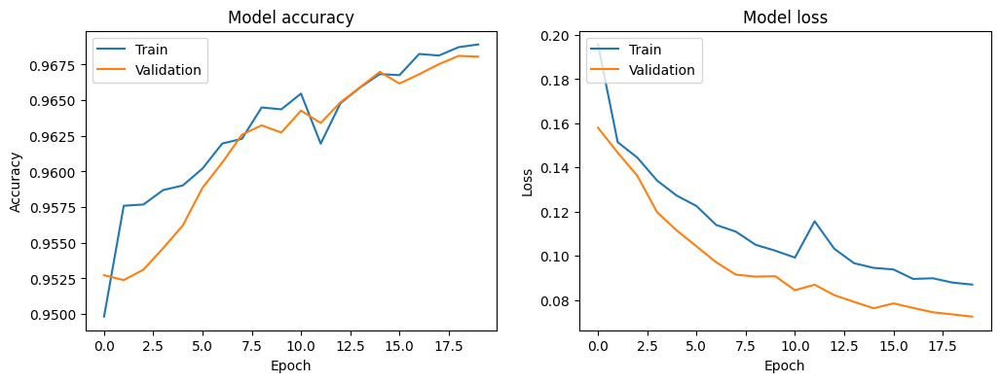

In [ ]:
import matplotlib.pyplot as plt

# Plot training & validation accuracy values
plt.figure(figsize=(12, 4))

plt.subplot(1, 2, 1)
plt.plot(history1.history['accuracy'])
plt.plot(history1.history['val_accuracy'])
plt.title('Model accuracy')
plt.ylabel('Accuracy')
plt.xlabel('Epoch')
plt.legend(['Train', 'Validation'], loc='upper left')

# Plot training & validation loss values
plt.subplot(1, 2, 2)
plt.plot(history1.history['loss'])
plt.plot(history1.history['val_loss'])
plt.title('Model loss')
plt.ylabel('Loss')
plt.xlabel('Epoch')
plt.legend(['Train', 'Validation'], loc='upper left')

plt.show()

In [ ]:
import pickle
unet_model_augmentation_file = "/content/drive/MyDrive/Cv_Project/U_net/unet_model_augmentation_model.pkl"
with open(unet_model_augmentation_file, 'wb') as file:
    pickle.dump(unet_model, file)

In [ ]:
import pickle
with open('/content/drive/MyDrive/Cv_Project/U_net/unet_model_augmentation_history.pkl', 'wb') as file:
    pickle.dump(history1.history, file)
print("Training history saved!")

Training history saved!


##Model Fusion Post Processing

#Edge Detection

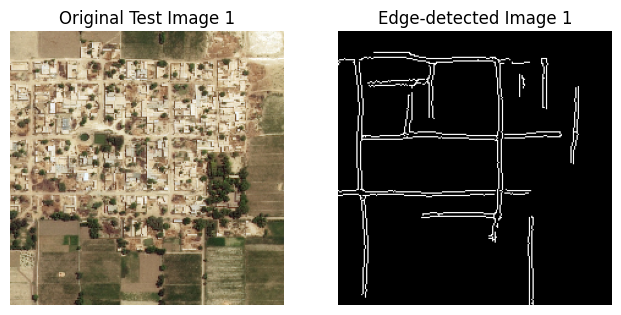

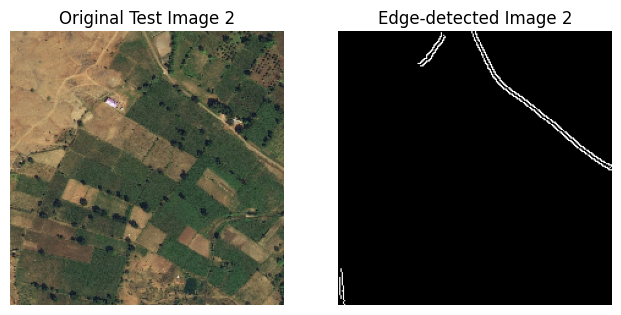

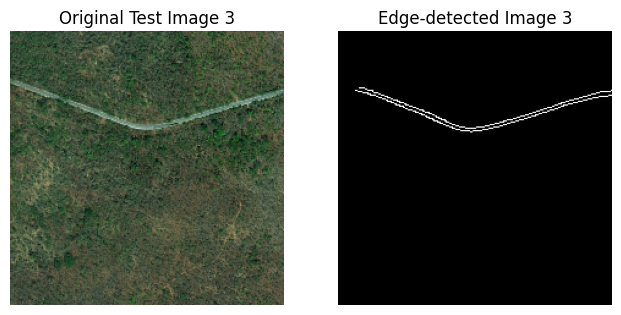

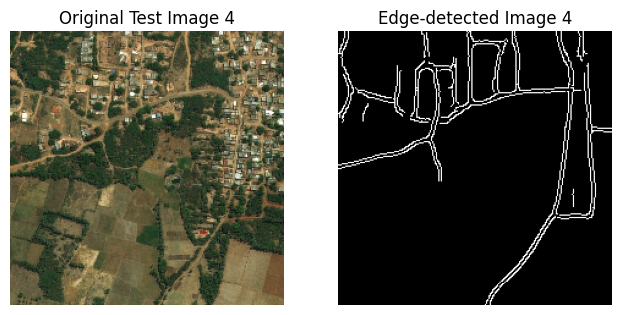

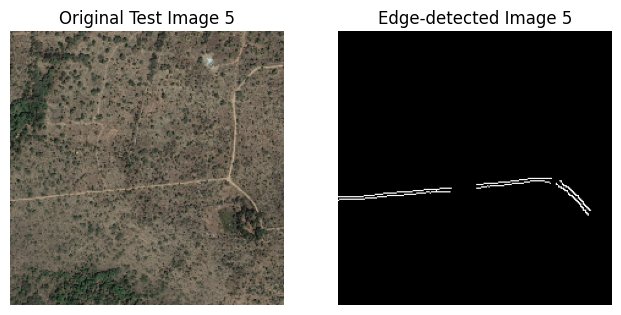

In [17]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

def apply_edge_detection(image):
    if image.ndim == 3 and image.shape[2] == 3:
        gray = cv2.cvtColor(image, cv2.COLOR_RGB2GRAY)
    else:
        gray = image
    if image.dtype != np.uint8:
        gray = (gray * 255).astype(np.uint8)
    edges = cv2.Canny(gray, 100, 200)
    return edges
edge_detected_predictions = np.array([apply_edge_detection(pred) for pred in predictions_fusion])
num_images_to_show = 5
for i in range(min(num_images_to_show, len(edge_detected_predictions))):
    plt.figure(figsize=(12, 6))
    plt.subplot(1, 3, 1)
    plt.imshow(test_images[i])
    plt.title(f'Original Test Image {i+1}')
    plt.axis('off')
    plt.subplot(1, 3, 2)
    plt.imshow(edge_detected_predictions[i].squeeze(), cmap='gray')
    plt.title(f'Edge-detected Image {i+1}')
    plt.axis('off')
    plt.show()

#Morphological Operations

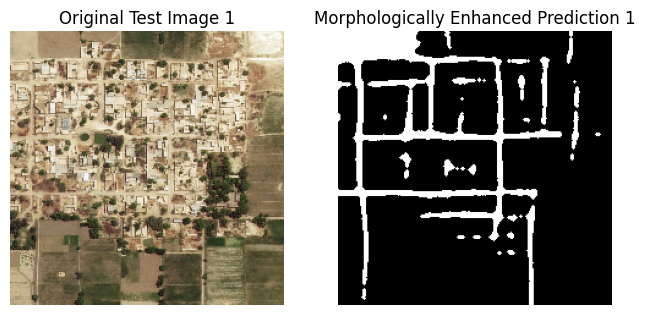

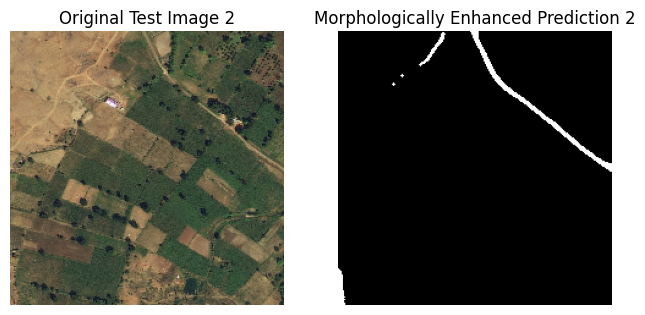

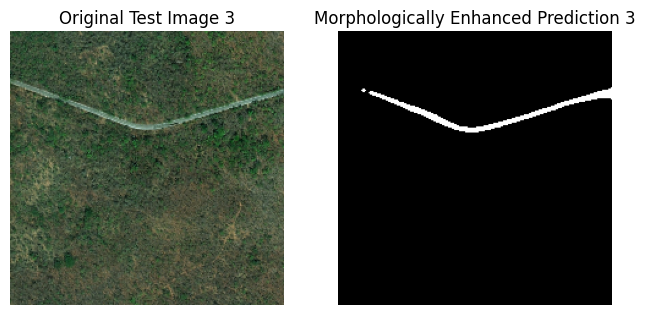

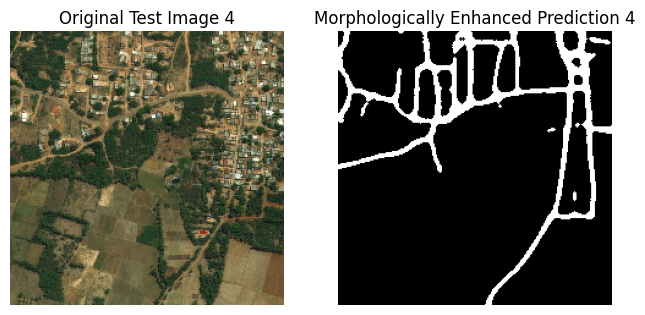

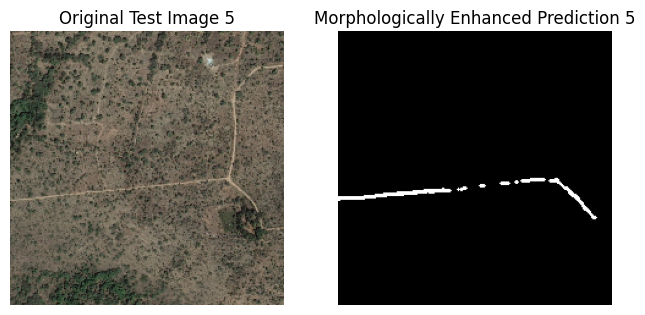

In [18]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

def apply_morphological_operations(prediction, kernel_size=3):
    kernel = cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (kernel_size, kernel_size))
    # Opening (Erosion followed by dilation, useful for removing noise)
    opened = cv2.morphologyEx(prediction, cv2.MORPH_OPEN, kernel)
    # Closing (Dilation followed by erosion, useful for closing small holes)
    closed = cv2.morphologyEx(opened, cv2.MORPH_CLOSE, kernel)
    return closed
morphological_predictions = []
for pred in predictions_thresholded:
  morph_pred = apply_morphological_operations(pred)
  morphological_predictions.append(morph_pred)
num_images_to_show = 5
for i, morph_pred in enumerate(morphological_predictions[:num_images_to_show]):
    plt.figure(figsize=(12, 6))
    plt.subplot(1, 3, 1)
    plt.imshow(test_images[i])
    plt.title(f'Original Test Image {i+1}')
    plt.axis('off')
    plt.subplot(1,3,2)
    plt.imshow(morph_pred.squeeze(), cmap='gray')
    plt.title(f'Morphologically Enhanced Prediction {i+1}')
    plt.axis('off')
    plt.show()

#Conditonal Random Field

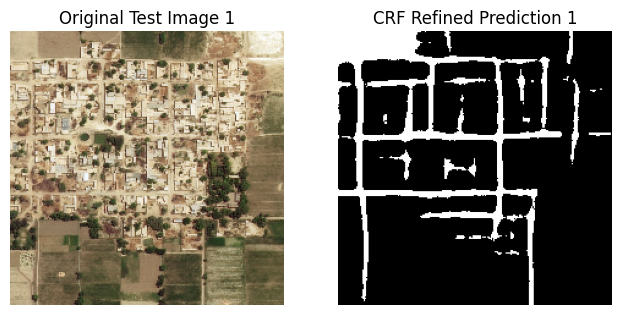

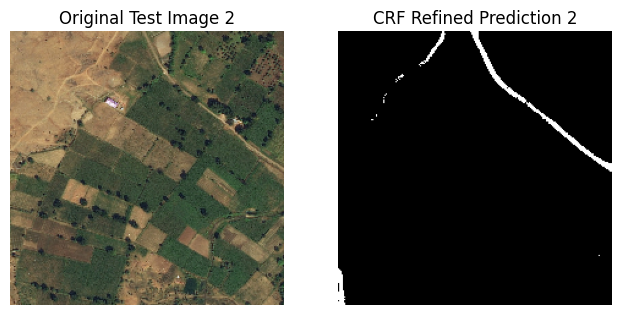

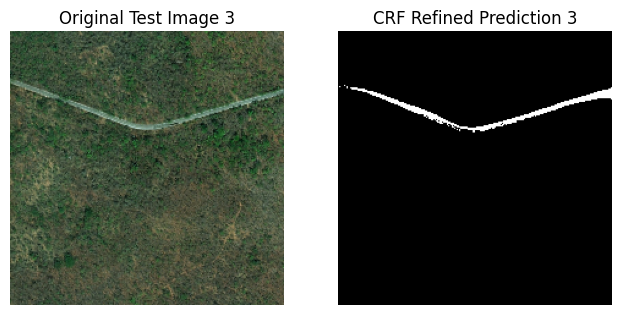

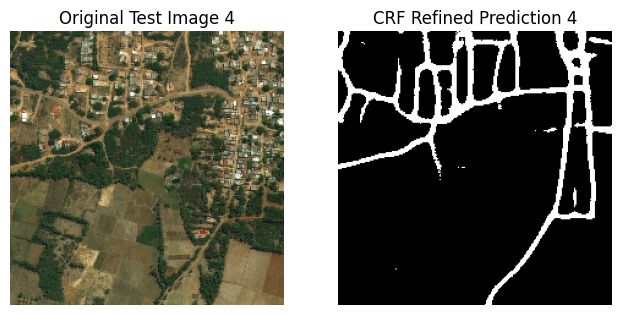

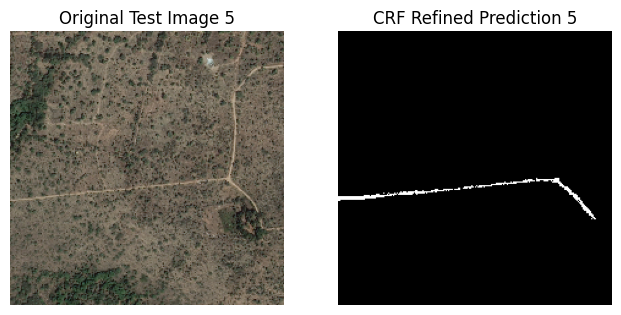

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import pydensecrf.densecrf as dcrf
from pydensecrf.utils import unary_from_softmax
# Function to apply Conditional Random Fields (CRF) to refine the predictions
def apply_crf(image, prediction_prob, gdims=(3, 3), bdims=(80, 80), iter=5):
    prediction_prob = np.clip(prediction_prob, a_min=1e-7, a_max=1 - 1e-7)
    prediction_prob = 1 - prediction_prob  # Invert probabilities for CRF processing

    # Create unary energy from the inverted  probabilities.
    unary_energy = np.stack((1 - prediction_prob, prediction_prob), axis=0)
    unary_energy = unary_energy.reshape((2, -1))  # Flatten to have shape (n_classes, height * width)
    unary = unary_from_softmax(-np.log(unary_energy)) # Compute unary potentials
    if image.dtype != np.uint8:
        image = (image * 255).astype(np.uint8)
    # Set up the DenseCRF model.
    d = dcrf.DenseCRF2D(image.shape[1], image.shape[0], 2)
    d.setUnaryEnergy(unary)
    # Add Gaussian pairwise potentials for smoothness.
    d.addPairwiseGaussian(sxy=gdims, compat=3)
    # Add bilateral pairwise potentials for appearance-sensitive smoothing.
    d.addPairwiseBilateral(sxy=bdims, srgb=(13, 13, 13), rgbim=image, compat=10)
    # Run inference to get the refined predictions.
    Q = d.inference(iter)
    Q = np.array(Q).reshape((2, image.shape[0], image.shape[1]))

    return np.argmax(Q, axis=0)
crf_refined_predictions = []

for i in range(len(test_images)):
    original_image = test_images_np[i]
    prediction = predictions_thresholded[i].squeeze()
    # Apply CRF on the prediction and original image
    refined_prediction = apply_crf(original_image, prediction)
    crf_refined_predictions.append(refined_prediction)
num_images_to_show = 5
for i in range(min(num_images_to_show, len(crf_refined_predictions))):
    plt.figure(figsize=(12, 6))
    plt.subplot(1, 3, 1)
    plt.imshow(test_images[i])
    plt.title(f'Original Test Image {i+1}')
    plt.axis('off')
    plt.subplot(1,3,2)
    plt.imshow(crf_refined_predictions[i], cmap='gray')
    plt.title(f'CRF Refined Prediction {i+1}')
    plt.axis('off')
    plt.show()

#Predictions on Unet Model

35/35 [==============================] - 11s 307ms/step


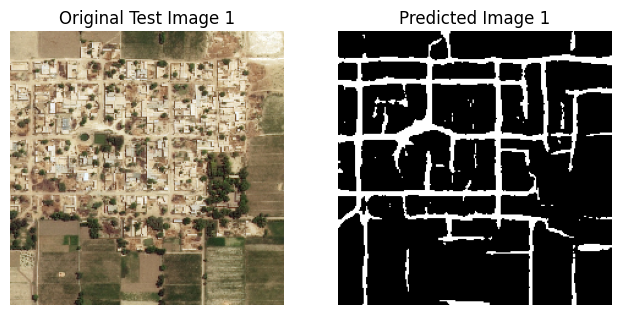

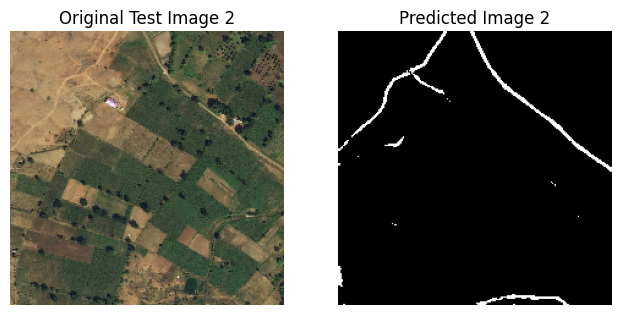

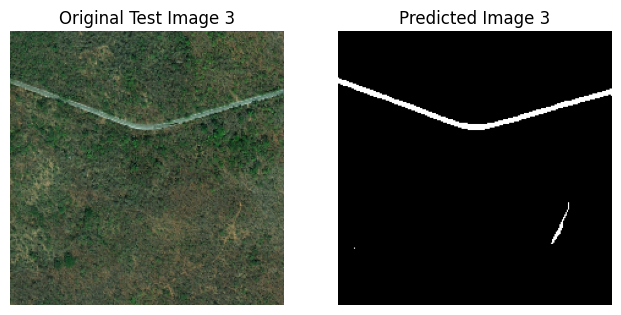

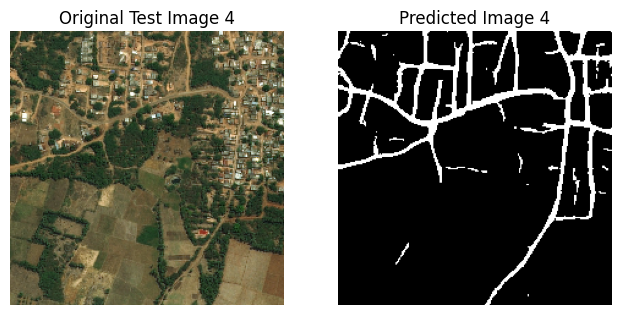

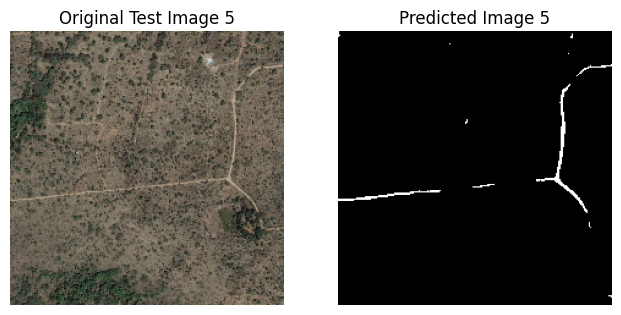

In [9]:
# Unet Augmentation
import os
import cv2
import numpy as np
import pickle
import matplotlib.pyplot as plt
with open('/content/drive/MyDrive/Cv_Project/U_net/unet_model_augmentation_model.pkl', 'rb') as file:
    unet_model = pickle.load(file)

test_folder = '/content/dataset-folder/test'

test_images = []
test_filenames = []
for filename in sorted(os.listdir(test_folder)):
    if filename.endswith('.jpg'):
        img_path = os.path.join(test_folder, filename)
        img = cv2.imread(img_path, cv2.IMREAD_COLOR)
        img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
        img = cv2.resize(img, (224, 224))
        img = img / 255.0
        test_images.append(img)
        test_filenames.append(filename)
test_images_unet_aug = np.array(test_images)
threshold = 0.1
predictions_ua = unet_model.predict(test_images_unet_aug)
predictions_unet_augmentation = (predictions_ua > threshold).astype(np.uint8)
num_images_to_show = 5
for i in range(min(num_images_to_show, len(predictions_ua))):
    plt.figure(figsize=(12, 6))
    plt.subplot(1, 3, 1)
    plt.imshow(test_images_unet_aug[i])
    plt.title(f'Original Test Image {i+1}')
    plt.axis('off')
    plt.subplot(1,3,2)
    plt.imshow(predictions_unet_augmentation[i].squeeze(), cmap='gray')
    plt.title(f'Predicted Image {i+1}')
    plt.axis('off')
    plt.show()


#Edge Detection

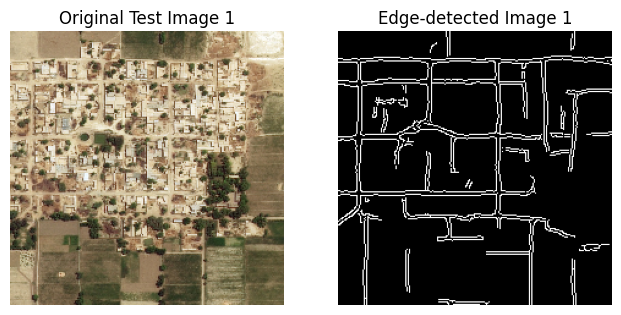

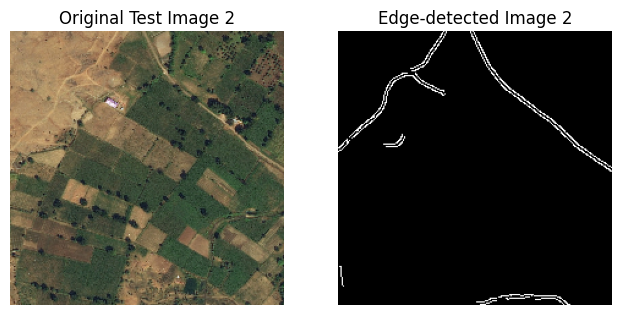

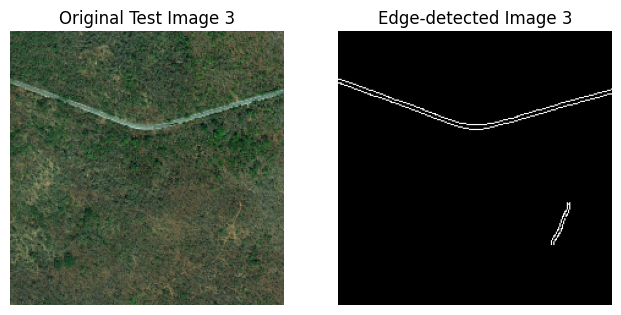

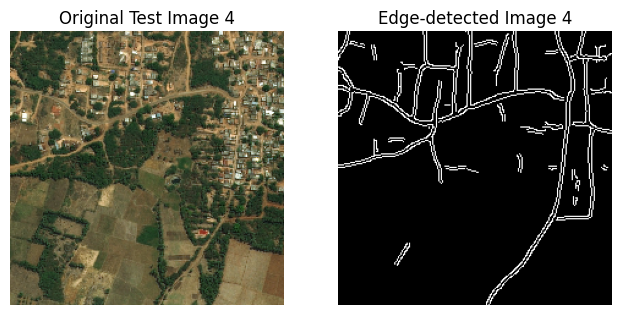

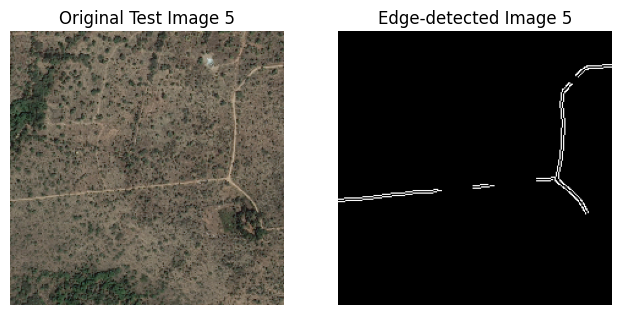

In [10]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
def apply_edge_detection(image):
    if image.ndim == 3 and image.shape[2] == 3:
        gray = cv2.cvtColor(image, cv2.COLOR_RGB2GRAY)
    else:
        gray = image
    if image.dtype != np.uint8:
        gray = (gray * 255).astype(np.uint8)
    edges = cv2.Canny(gray, 100, 200)
    return edges
edge_detected_predictions = np.array([apply_edge_detection(pred) for pred in predictions_ua])
num_images_to_show = 5
for i in range(min(num_images_to_show, len(edge_detected_predictions))):
    plt.figure(figsize=(12, 6))
    plt.subplot(1, 3, 1)
    plt.imshow(test_images_unet_aug[i])
    plt.title(f'Original Test Image {i+1}')
    plt.axis('off')
    plt.subplot(1,3,2)
    plt.imshow(edge_detected_predictions[i], cmap='gray')
    plt.title(f'Edge-detected Image {i+1}')
    plt.axis('off')
    plt.show()

#Morphological Operations

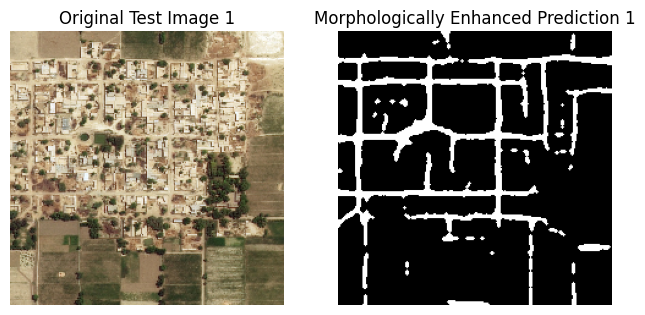

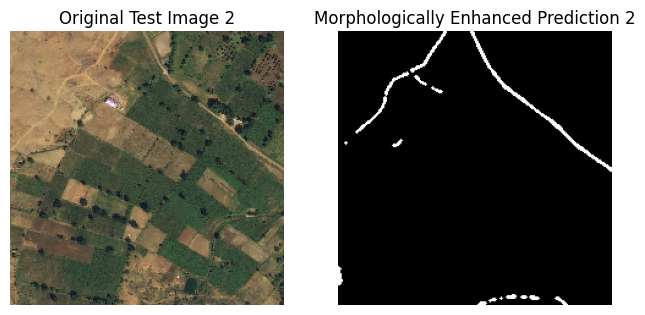

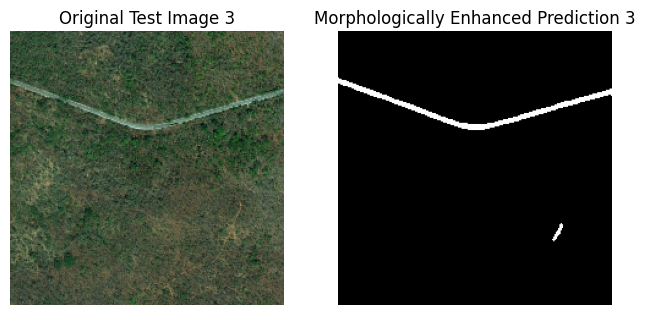

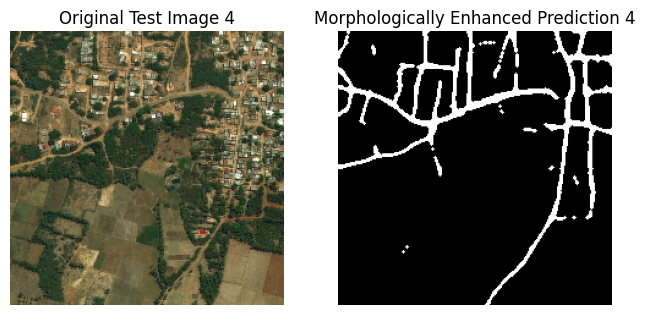

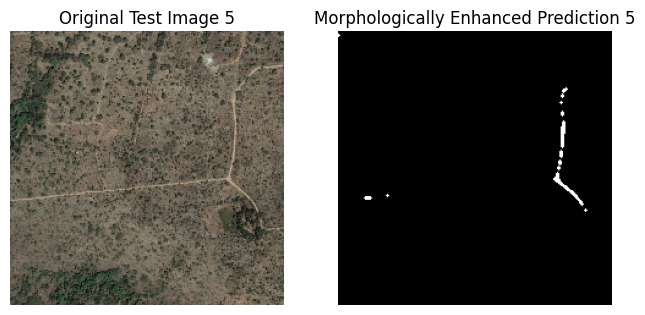

In [13]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

def apply_morphological_operations(prediction, kernel_size=3):
    kernel = cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (kernel_size, kernel_size))
    opened = cv2.morphologyEx(prediction, cv2.MORPH_OPEN, kernel))
    closed = cv2.morphologyEx(opened, cv2.MORPH_CLOSE, kernel)

    return closed
morphological_predictions = []
for pred in predictions_unet_augmentation:
  morph_pred = apply_morphological_operations(pred)
  morphological_predictions.append(morph_pred)
num_images_to_show = 5
for i, morph_pred in enumerate(morphological_predictions[:num_images_to_show]):
    plt.figure(figsize=(12, 6))
    plt.subplot(1, 3, 1)
    plt.imshow(test_images_unet_aug[i])
    plt.title(f'Original Test Image {i+1}')
    plt.axis('off')
    plt.subplot(1,3,2)
    plt.imshow(morph_pred, cmap='gray')
    plt.title(f'Morphologically Enhanced Prediction {i+1}')
    plt.axis('off')
    plt.show()

#Conditional Random Field

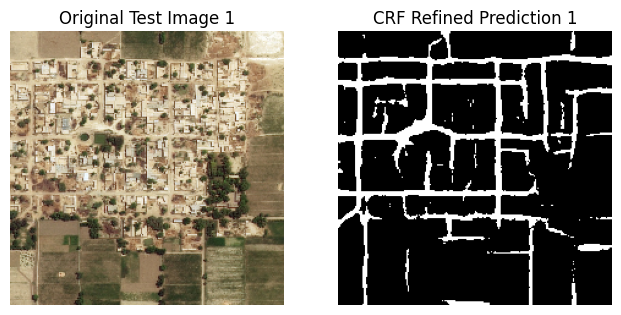

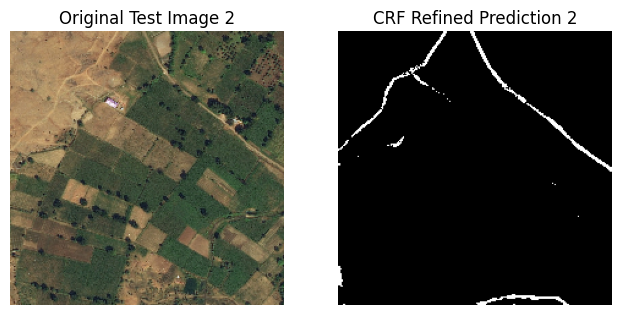

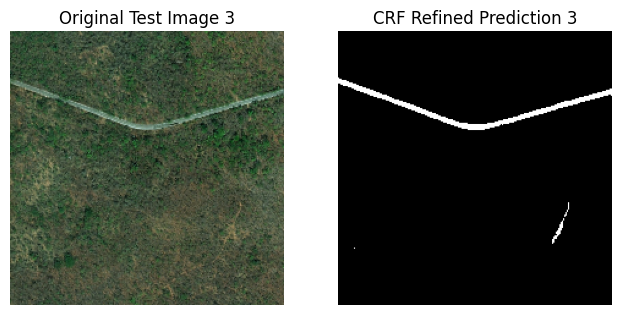

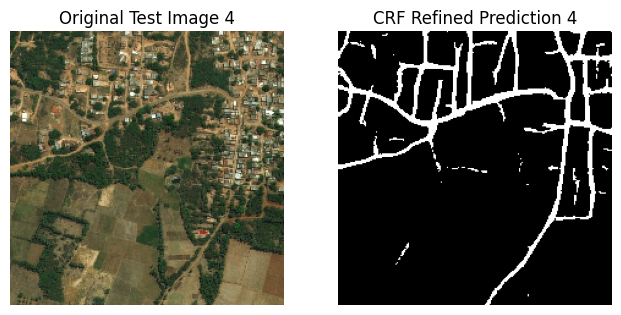

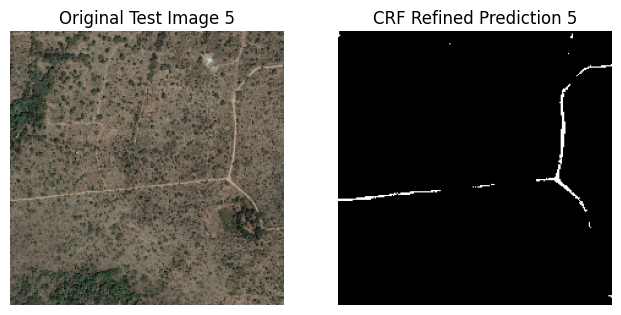

In [12]:
import numpy as np
import matplotlib.pyplot as plt
import pydensecrf.densecrf as dcrf
from pydensecrf.utils import unary_from_softmax

def apply_crf(image, prediction_prob, gdims=(3, 3), bdims=(80, 80), iter=5):
    prediction_prob = np.clip(prediction_prob, a_min=1e-7, a_max=1 - 1e-7)
    prediction_prob = 1 - prediction_prob
    unary_energy = np.stack((1 - prediction_prob, prediction_prob), axis=0)
    unary_energy = unary_energy.reshape((2, -1))
    unary = unary_from_softmax(-np.log(unary_energy))
    if image.dtype != np.uint8:
        image = (image * 255).astype(np.uint8)
    d = dcrf.DenseCRF2D(image.shape[1], image.shape[0], 2)
    d.setUnaryEnergy(unary)
    d.addPairwiseGaussian(sxy=gdims, compat=3)
    d.addPairwiseBilateral(sxy=bdims, srgb=(13, 13, 13), rgbim=image, compat=10)
    Q = d.inference(iter)
    Q = np.array(Q).reshape((2, image.shape[0], image.shape[1]))

    return np.argmax(Q, axis=0)
crf_refined_predictions = []

for i in range(len(test_images)):
    original_image = test_images_unet_aug[i]
    prediction = predictions_unet_augmentation[i].squeeze()
    refined_prediction = apply_crf(original_image, prediction)
    crf_refined_predictions.append(refined_prediction)
num_images_to_show = 5
for i in range(min(num_images_to_show, len(crf_refined_predictions))):
    plt.figure(figsize=(12, 6))
    plt.subplot(1, 3, 1)
    plt.imshow(test_images_unet_aug[i])
    plt.title(f'Original Test Image {i+1}')
    plt.axis('off')
    plt.subplot(1,3,2)
    plt.imshow(crf_refined_predictions[i], cmap='gray')
    plt.title(f'CRF Refined Prediction {i+1}')
    plt.axis('off')
    plt.show()